In [1]:
from helpers import *

In [2]:
df = pd.read_csv("rfm_review.csv")
df.head()

,recency,frequency,monetary,avg_satisfaction
0,-116.0,1,129.90,5.0
1,-119.0,1,18.90,4.0
2,-542.0,1,69.00,3.0
3,-326.0,1,25.99,4.0
4,-293.0,1,180.00,5.0


## Checking RFM 3D 

In [3]:
show_3d(df, "recency", "frequency", "monetary")

In [4]:
df_norm = normalize_dataframe(df)
df_norm.head()

,recency,frequency,monetary,avg_satisfaction
0,0.840659,0.0,0.009603,1.00
1,0.836538,0.0,0.001343,0.75
2,0.255495,0.0,0.005071,0.50
3,0.552198,0.0,0.001871,0.75
4,0.597527,0.0,0.013330,1.00


## Check RFM Normalised data

In [5]:
show_3d(df_norm, "recency", "frequency", "monetary")

Projecting 3-dimensional data to 2D


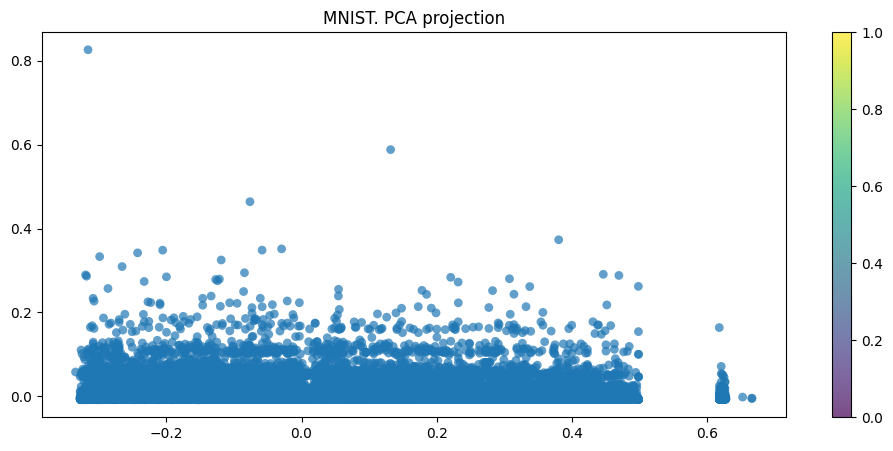

In [6]:
## Checking with PCA, reducing to 2 dimensions
pca = PCA(n_components=2)
X = df_norm[["recency", "frequency", "monetary"]]
# X = df_norm[["recency", "frequency", "monetary"]].sample(n=50000)
X_reduced = pca.fit_transform(X)

print('Projecting %d-dimensional data to 2D' % X.shape[1])

plt.figure(figsize=(12,5))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], 
            edgecolor='none', alpha=0.7, s=40)
plt.colorbar()
plt.title('MNIST. PCA projection')
plt.show()

In [7]:
tsne = TSNE(random_state=42)
X_tsne = tsne.fit_transform(X)

Text(0.5, 1.0, 'MNIST. t-SNE projection')

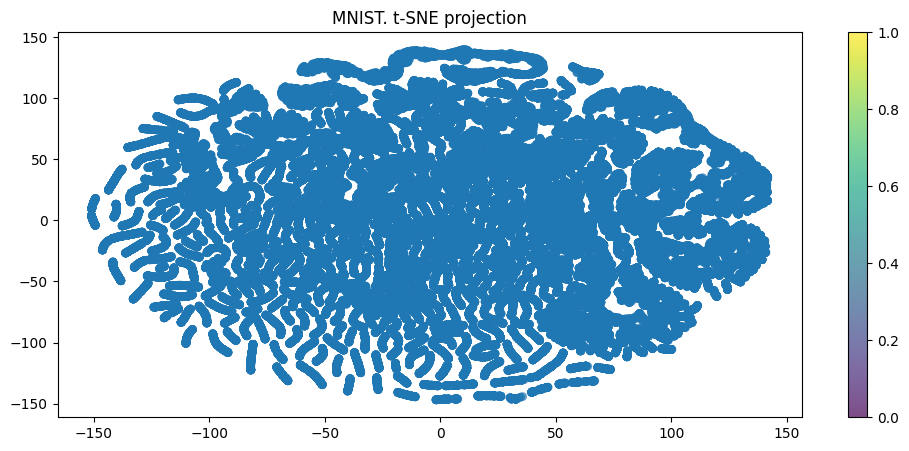

In [8]:
plt.figure(figsize=(12,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1],
            edgecolor='none', alpha=0.7, s=40)
plt.colorbar()
plt.title('MNIST. t-SNE projection')

Projecting 4-dimensional data to 2D


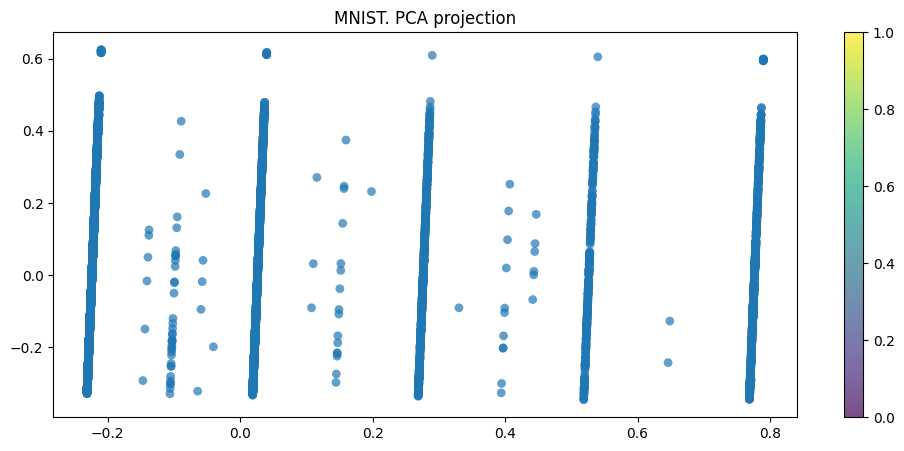

In [269]:
pca = PCA(n_components=2)
X_2 = df_norm[["recency", "frequency", "monetary", "avg_satisfaction"]]
X_reduced_2 = pca.fit_transform(X_2)

print('Projecting %d-dimensional data to 2D' % X_2.shape[1])

plt.figure(figsize=(12,5))
plt.scatter(X_reduced_2[:, 0], X_reduced_2[:, 1], 
            edgecolor='none', alpha=0.7, s=40)
plt.colorbar()
plt.title('MNIST. PCA projection')
plt.show()

In [ ]:
tsne = TSNE(random_state=42)
X_tsne_3 = tsne.fit_transform(X_reduced_2)

Text(0.5, 1.0, 't-SNE projection')

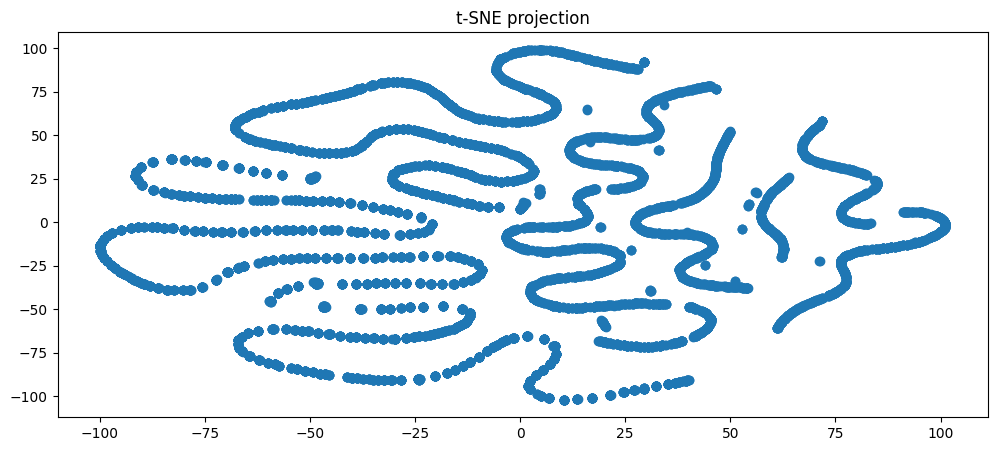

In [280]:
plt.figure(figsize=(12,5))
plt.scatter(X_tsne_3[:, 0], X_tsne_3[:, 1])
plt.title('t-SNE projection')

In [ ]:
tsne = TSNE(random_state=42)
X_tsne_2 = tsne.fit_transform(X_2)

Text(0.5, 1.0, 't-SNE projection')

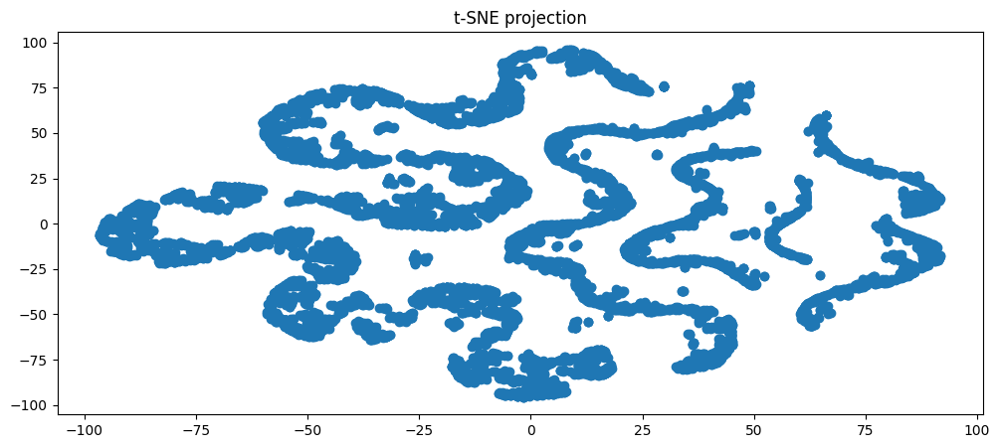

In [279]:
plt.figure(figsize=(12,5))
plt.scatter(X_tsne_2[:, 0], X_tsne_2[:, 1])
plt.title('t-SNE projection')

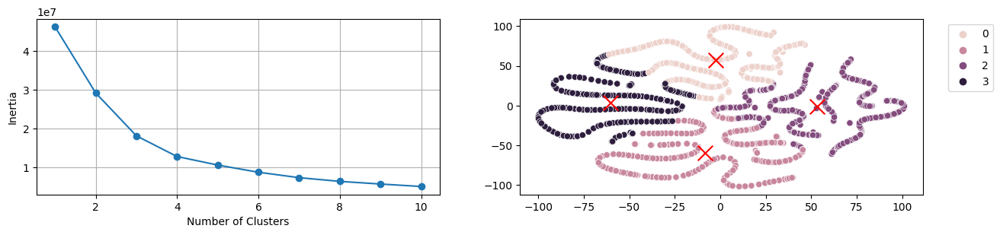

<Figure size 1000x300 with 0 Axes>

In [281]:
show_segmentation(X_tsne_3, 4)

/var/folders/x_/0z24g8110_n09vlvhxmrh0_w0000gp/T/ipykernel_34644/4130914076.py:21: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



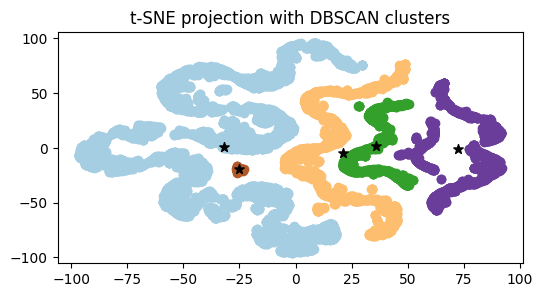

In [305]:
import matplotlib.cm as cm  

X_choosen = X_tsne_2

# 1. Apply DBSCAN clustering  
dbscan = DBSCAN(eps=7, min_samples=5)  
# dbscan = DBSCAN(eps=10, min_samples=5)  
cluster_labels = dbscan.fit_predict(X_choosen)  


# 2. Determine centroids of clusters  
unique_labels = np.unique(cluster_labels)  
centroids = []

for label in unique_labels:  
    mask = cluster_labels == label  
    cluster_points = X_choosen[mask]  
    centroid = np.mean(cluster_points, axis=0)
    centroids.append(centroid)  

centroids = np.array(centroids)
colormap = cm.get_cmap("Paired", len(unique_labels))  

# Plot t-SNE scatter plot with centroids and different colors  
plt.figure(figsize=(6, 3))  
for i, label in enumerate(unique_labels):
    mask = cluster_labels == label  
    plt.scatter(X_choosen[mask, 0], X_choosen[mask, 1], color=colormap(i), label=f'Cluster {label}')  

# Plot centroids with black star marker  
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', color='black', s=50)  

plt.title('t-SNE projection with DBSCAN clusters')  
plt.show()

# Paired
# colors = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']
# for c in colors:
#     test(c)

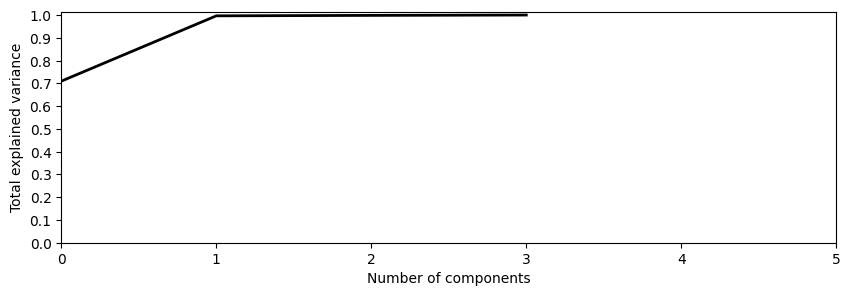

In [263]:
pca = PCA().fit(X_2)

plt.figure(figsize=(10,3))
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='k', lw=2)
plt.xlabel('Number of components')
plt.ylabel('Total explained variance')
plt.xlim(0, 5)
plt.yticks(np.arange(0, 1.1, 0.1))
# plt.axvline(21, c='b')
# plt.axhline(0.9, c='r')
plt.show()

In [265]:
# assuming you have a dataframe called "data" with your features  
# perform PCA on the data  
pca = PCA(n_components=1)  
pca.fit(X_2)  
  
# get the loadings for the first principal component  
loadings = pca.components_[0]  
  
# create a dataframe to display the loadings  
loadings_df = pd.DataFrame({'Feature': X_2.columns, 'Loading': loadings})  
loadings_df = loadings_df.sort_values('Loading', ascending=False)  
  
print(loadings_df)  

            Feature   Loading
2          monetary  0.001512
1         frequency -0.000525
0           recency -0.007159
3  avg_satisfaction -0.999973


In [221]:
explained_variance = pca.explained_variance_ratio_[0] # explained variance of the first principal component  
feature_contrib = loadings_df['Loading'].apply(lambda x: x**2)  
loadings_df["Contribution"] = round(feature_contrib / feature_contrib.sum() * explained_variance,5) 


In [222]:
loadings_df

,Feature,Loading,Contribution
2,monetary,0.000172,0.00000
1,frequency,-0.001013,0.00000
0,recency,-0.025877,0.00066
3,avg_satisfaction,-0.999665,0.98717
